# **Implementasi CNN Arsitektur VGG-19 untuk Klasifikasi Burung di Sumatera**



**Tugas Besar IF4012-Pengolahan Citra Digital**

**Program Studi Teknik Informatika, Fakultas Tekologi Industri, Institut Teknologi Sumatera**

Kelompok Sumatraining

*   Umi Afifah - 121140008 - Teknik Informatika
*   Abira Husnia - 121140113 - Teknik Informatika
*   Lilis Swastika - 121140232 - Teknik Informatika
*   Alber Analafean - 121450146 - Sains Data



# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# Model Learning Rate 1e-3

## Epoch 5

### Model

In [ ]:
# Library
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import numpy as np

#Data
train_dir  = '/content/drive/MyDrive/Image Processing/Image Processing/data split/train'
test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'

#Parameter
batch_size = 32
lr=1e-3
epochs=5

#ImageDataGenerator & Augmentasi Data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True)
valid_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    directory=train_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

test_data = valid_datagen.flow_from_directory(
    directory=test_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

#MODEL VGG19
#VGG16 sebagai base model
base_model = tf.keras.applications.VGG19(
    weights='imagenet',  #Pre-trained weights ImageNet
    include_top=False,
    input_shape=(224,224, 3)
)

#freeze layer terakhir dari base model untuk fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-5]:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(5, activation='sigmoid')
])

#Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

#Callback EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

#Training model
history = model.fit(
    train_data,
    validation_data=test_data,
    epochs=epochs,
    callbacks=[early_stopping])


Found 720 images belonging to 5 classes.
Found 180 images belonging to 5 classes.
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 7, 7, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,236,421 (88.64 MB)

 Trainable params: 12,651,269 (48.26 MB)

 Non-trainable params: 10,585,152 (40.38 MB)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.2240 - loss: 0.7180 - val_accuracy: 0.1667 - val_loss: 0.5100
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 41s 522ms/step - accuracy: 0.2110 - loss: 0.5376 - val_accuracy: 0.2000 - val_loss: 0.5119
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 543ms/step - accuracy: 0.1839 - loss: 0.5200 - val_accuracy: 0.2000 - val_loss: 0.5041
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 529ms/step - accuracy: 0.2336 - loss: 0.5091 - val_accuracy: 0.2444 - val_loss: 0.5010
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 475ms/step - accuracy: 0.2161 - loss: 0.5092 - val_accuracy: 0.2278 - val_loss: 0.4966


### Akurasi dan Evaluasi Model dengan Data Test

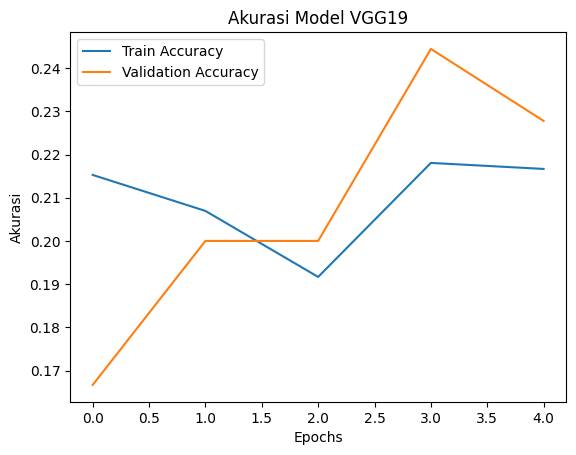

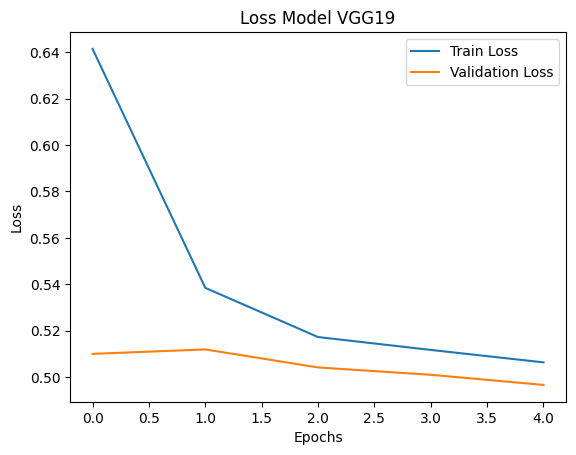

Found 180 images belonging to 5 classes.
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 328ms/step


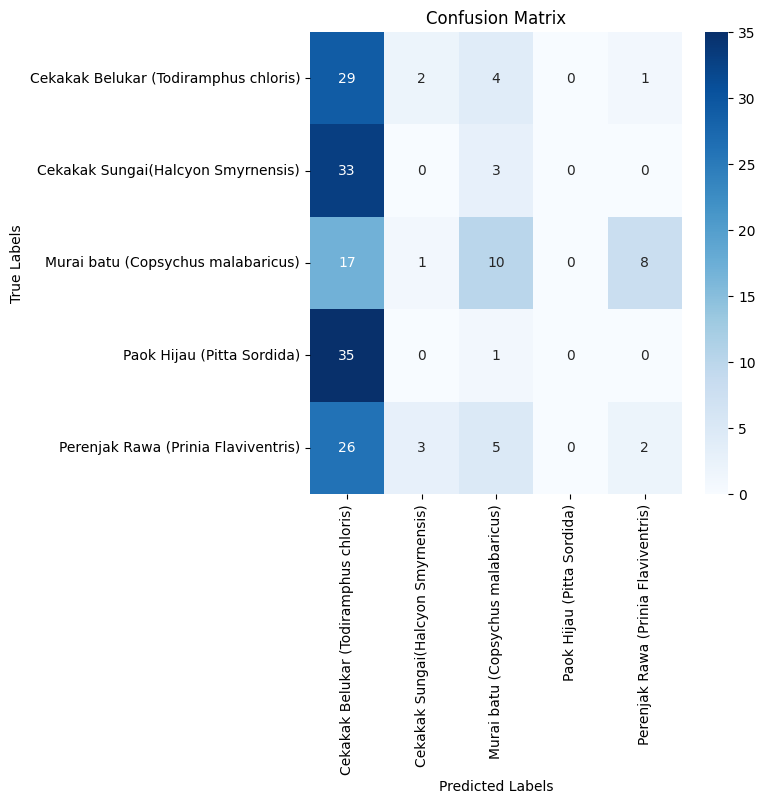

Classification Report:
               precision    recall  f1-score   support

           0       0.21      0.81      0.33        36
           1       0.00      0.00      0.00        36
           2       0.43      0.28      0.34        36
           3       0.00      0.00      0.00        36
           4       0.18      0.06      0.09        36

    accuracy                           0.23       180
   macro avg       0.16      0.23      0.15       180
weighted avg       0.16      0.23      0.15       180

Accuracy per Class:
Cekakak Belukar (Todiramphus chloris): 80.56%
Cekakak Sungai(Halcyon Smyrnensis): 0.00%
Murai batu (Copsychus malabaricus): 27.78%
Paok Hijau (Pitta Sordida): 0.00%
Perenjak Rawa (Prinia Flaviventris): 5.56%


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
#Plot Training
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Akurasi Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Akurasi')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


test_dir = test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'
test_datagen = ImageDataGenerator(rescale=1./255)

#Load data test
test_data = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    color_mode='rgb',
    class_mode='binary',
    shuffle=False
)

#Prediksi model pada data test
predictions = model.predict(test_data, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_data.classes


#Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)

#Visualisasi Confusion Matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_data.class_indices.keys(),
            yticklabels=test_data.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan laporan klasifikasi
print("Classification Report:\n", classification_report(true_labels, predicted_labels))

# Menghitung akurasi per kelas
accuracyclass = cm.diagonal() / cm.sum(axis=1)

# Menampilkan akurasi per kelas
print("Accuracy per Class:")
for class_name, accuracy in zip(test_data.class_indices.keys(), accuracyclass):
    print(f"{class_name}: {accuracy * 100:.2f}%")


### Testing

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


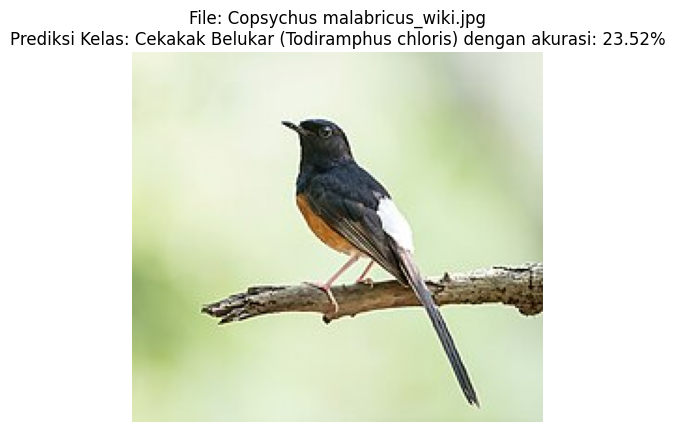

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


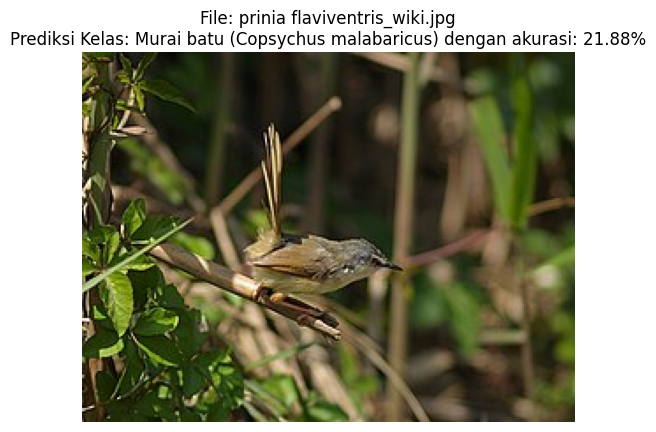

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


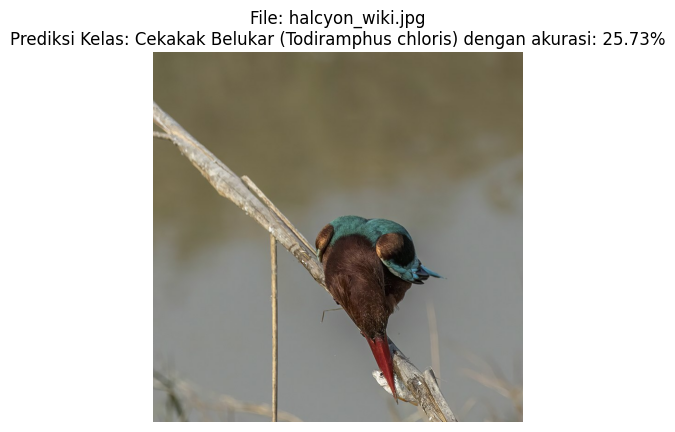

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


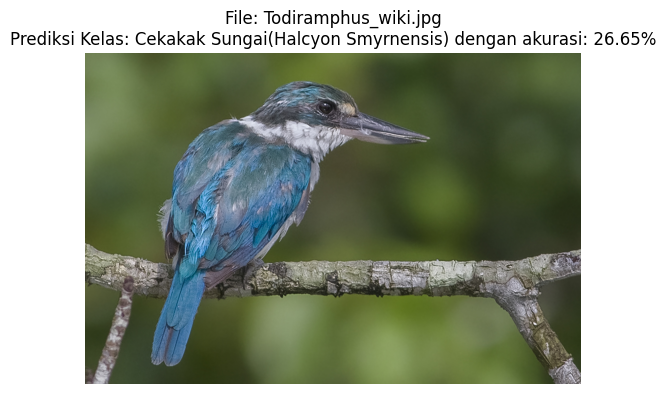

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


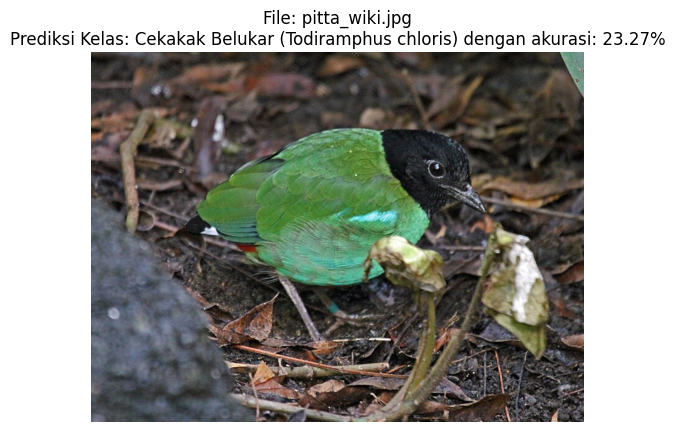

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Fungsi untuk memuat dan memproses gambar
def load_img(imge, target_size=(224, 224)):
    img = image.load_img(imge, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img_array

# Path direktori gambar
image_dir = '/content/drive/MyDrive/Image Processing/Gambar diluar split'

# Dapatkan semua file gambar dalam folder
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]

# Iterasi untuk setiap gambar
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)

    # Memuat dan memproses gambar
    img = load_img(image_path)

    # Prediksi dari model
    predictions = model.predict(img)
    predicted_label = np.argmax(predictions, axis=1)
    predicted_class = list(test_data.class_indices.keys())[predicted_label[0]]

    # Menampilkan gambar, prediksi dan nama file
    plt.imshow(image.load_img(image_path))
    plt.axis('off')
    plt.title(f'File: {image_file}\nPrediksi Kelas: {predicted_class} dengan akurasi: {predictions[0][predicted_label[0]]*100:.2f}%')
    plt.show()


## Epoch 10

### Model

In [ ]:
# Library
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import numpy as np

#Data
train_dir  = '/content/drive/MyDrive/Image Processing/Image Processing/data split/train'
test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'

#Parameter
batch_size = 32
lr=1e-3
epochs=10

#ImageDataGenerator & Augmentasi Data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True)
valid_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    directory=train_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

test_data = valid_datagen.flow_from_directory(
    directory=test_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

#MODEL VGG19
#VGG16 sebagai base model
base_model = tf.keras.applications.VGG19(
    weights='imagenet',  #Pre-trained weights ImageNet
    include_top=False,
    input_shape=(224,224, 3)
)

#freeze layer terakhir dari base model untuk fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-5]:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(5, activation='sigmoid')
])

#Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

#Callback EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

#Training model
history = model.fit(
    train_data,
    validation_data=test_data,
    epochs=epochs,
    callbacks=[early_stopping])


Found 720 images belonging to 5 classes.
Found 180 images belonging to 5 classes.


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 7, 7, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,236,421 (88.64 MB)

 Trainable params: 12,651,269 (48.26 MB)

 Non-trainable params: 10,585,152 (40.38 MB)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 23s 654ms/step - accuracy: 0.1516 - loss: 1.0331 - val_accuracy: 0.2444 - val_loss: 0.5236
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 519ms/step - accuracy: 0.2293 - loss: 0.5284 - val_accuracy: 0.2222 - val_loss: 0.5062
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 458ms/step - accuracy: 0.2156 - loss: 0.5194 - val_accuracy: 0.2611 - val_loss: 0.4983
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 475ms/step - accuracy: 0.2110 - loss: 0.5089 - val_accuracy: 0.3167 - val_loss: 0.5014
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 551ms/step - accuracy: 0.2536 - loss: 0.5057 - val_accuracy: 0.2778 - val_loss: 0.4733
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 20s 467ms/step - accuracy: 0.3210 - loss: 0.4838 - val_accuracy: 0.4278 - val_loss: 0.4533
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 469ms/step - accuracy: 0.3819 - loss: 0.4628 - val_accuracy: 0.4444 - val_loss: 0.4176
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 467ms/step - accuracy: 0.4282 - loss: 0.4312 - val_accuracy: 0.472

### Akurasi dan Evaluasi Model dengan Data Test

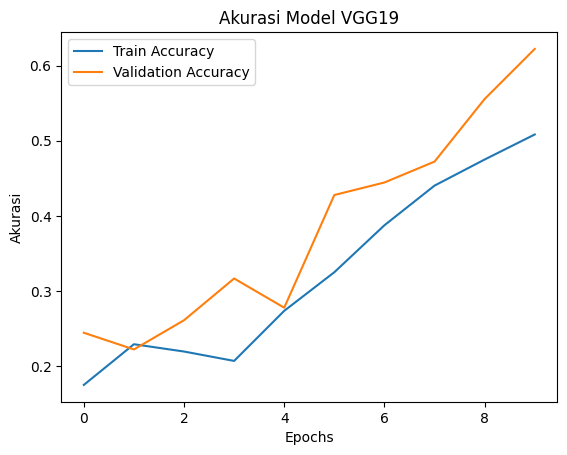

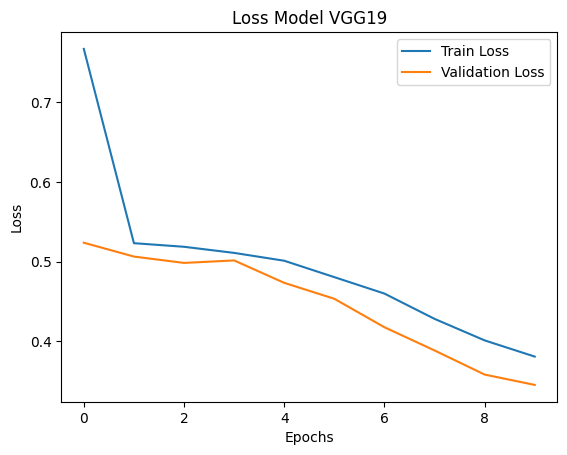

Found 180 images belonging to 5 classes.
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 202ms/step


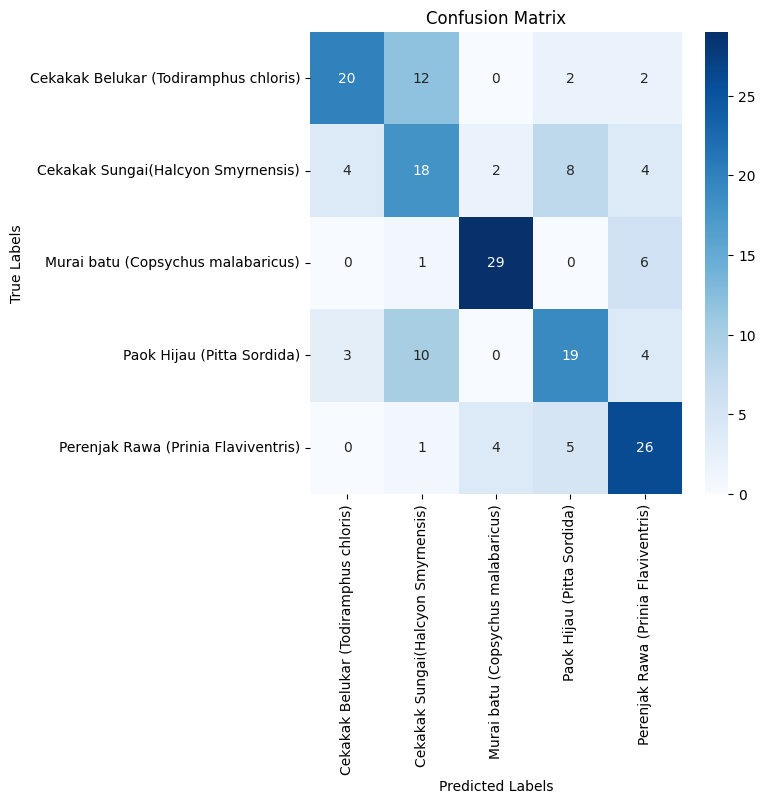

Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.56      0.63        36
           1       0.43      0.50      0.46        36
           2       0.83      0.81      0.82        36
           3       0.56      0.53      0.54        36
           4       0.62      0.72      0.67        36

    accuracy                           0.62       180
   macro avg       0.64      0.62      0.62       180
weighted avg       0.64      0.62      0.62       180

Accuracy per Class:
Cekakak Belukar (Todiramphus chloris): 55.56%
Cekakak Sungai(Halcyon Smyrnensis): 50.00%
Murai batu (Copsychus malabaricus): 80.56%
Paok Hijau (Pitta Sordida): 52.78%
Perenjak Rawa (Prinia Flaviventris): 72.22%


In [ ]:
#Plot Training
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Akurasi Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Akurasi')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


test_dir = test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'
test_datagen = ImageDataGenerator(rescale=1./255)

#Load data test
test_data = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    color_mode='rgb',
    class_mode='binary',
    shuffle=False
)

#Prediksi model pada data test
predictions = model.predict(test_data, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_data.classes


#Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)

#Visualisasi Confusion Matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_data.class_indices.keys(),
            yticklabels=test_data.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan laporan klasifikasi
print("Classification Report:\n", classification_report(true_labels, predicted_labels))

# Menghitung akurasi per kelas
accuracyclass = cm.diagonal() / cm.sum(axis=1)

# Menampilkan akurasi per kelas
print("Accuracy per Class:")
for class_name, accuracy in zip(test_data.class_indices.keys(), accuracyclass):
    print(f"{class_name}: {accuracy * 100:.2f}%")


### Testing

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step


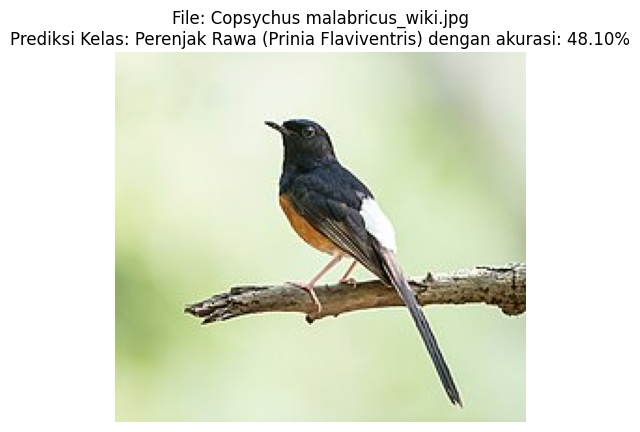

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


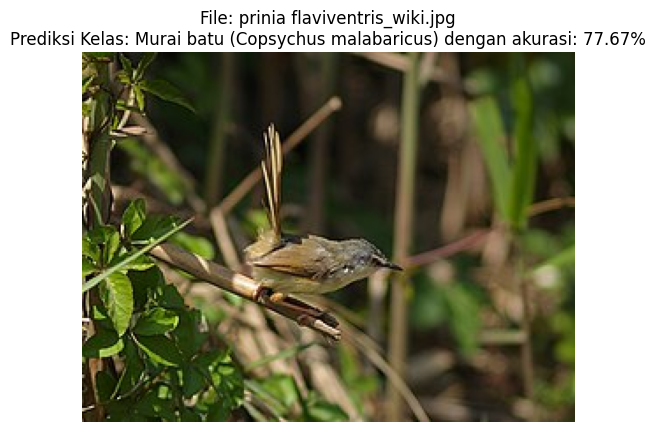

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


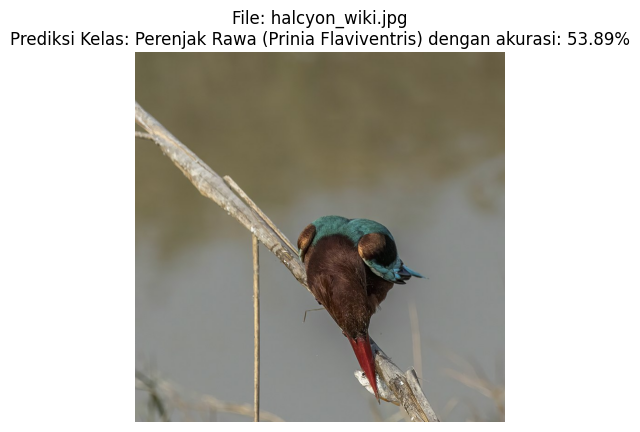

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


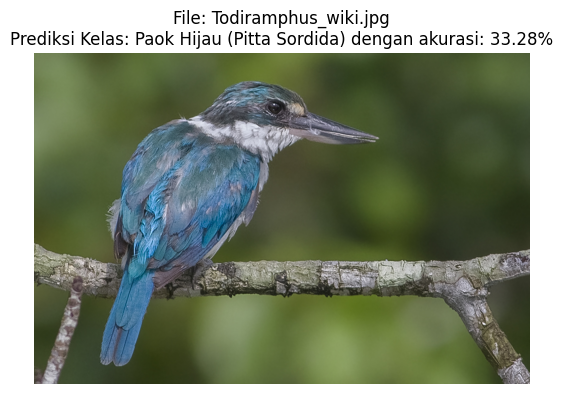

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


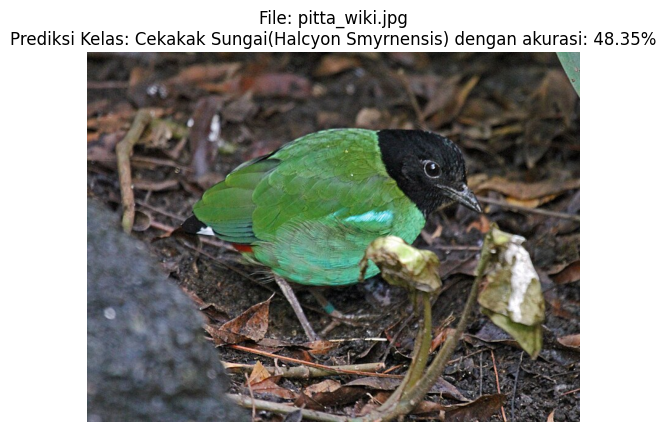

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Fungsi untuk memuat dan memproses gambar
def load_img(imge, target_size=(224, 224)):
    img = image.load_img(imge, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img_array

# Path direktori gambar
image_dir = '/content/drive/MyDrive/Image Processing/Gambar diluar split'

# Dapatkan semua file gambar dalam folder
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]

# Iterasi untuk setiap gambar
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)

    # Memuat dan memproses gambar
    img = load_img(image_path)

    # Prediksi dari model
    predictions = model.predict(img)
    predicted_label = np.argmax(predictions, axis=1)
    predicted_class = list(test_data.class_indices.keys())[predicted_label[0]]

    # Menampilkan gambar, prediksi dan nama file
    plt.imshow(image.load_img(image_path))
    plt.axis('off')
    plt.title(f'File: {image_file}\nPrediksi Kelas: {predicted_class} dengan akurasi: {predictions[0][predicted_label[0]]*100:.2f}%')
    plt.show()


## Epoch 15

### Model

In [ ]:
# Library
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import numpy as np

#Data
train_dir  = '/content/drive/MyDrive/Image Processing/Image Processing/data split/train'
test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'

#Parameter
batch_size = 32
lr=1e-3
epochs=15

#ImageDataGenerator & Augmentasi Data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True)
valid_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    directory=train_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

test_data = valid_datagen.flow_from_directory(
    directory=test_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

#MODEL VGG19
#VGG16 sebagai base model
base_model = tf.keras.applications.VGG19(
    weights='imagenet',  #Pre-trained weights ImageNet
    include_top=False,
    input_shape=(224,224, 3)
)

#freeze layer terakhir dari base model untuk fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-5]:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(5, activation='sigmoid')
])

#Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

#Callback EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

#Training model
history = model.fit(
    train_data,
    validation_data=test_data,
    epochs=epochs,
    callbacks=[early_stopping])


Found 720 images belonging to 5 classes.
Found 180 images belonging to 5 classes.


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 7, 7, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,236,421 (88.64 MB)

 Trainable params: 12,651,269 (48.26 MB)

 Non-trainable params: 10,585,152 (40.38 MB)

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 23s 634ms/step - accuracy: 0.2027 - loss: 0.9304 - val_accuracy: 0.2000 - val_loss: 0.5089
Epoch 2/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 516ms/step - accuracy: 0.2019 - loss: 0.5396 - val_accuracy: 0.2278 - val_loss: 0.5152
Epoch 3/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 522ms/step - accuracy: 0.1919 - loss: 0.5238 - val_accuracy: 0.2333 - val_loss: 0.5022
Epoch 4/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 517ms/step - accuracy: 0.2090 - loss: 0.5170 - val_accuracy: 0.2333 - val_loss: 0.5020
Epoch 5/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 534ms/step - accuracy: 0.2294 - loss: 0.5119 - val_accuracy: 0.2056 - val_loss: 0.4999
Epoch 6/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 525ms/step - accuracy: 0.2238 - loss: 0.5104 - val_accuracy: 0.2833 - val_loss: 0.4955
Epoch 7/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 514ms/step - accuracy: 0.2728 - loss: 0.5013 - val_accuracy: 0.2889 - val_loss: 0.4866
Epoch 8/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 28s 909ms/step - accuracy: 0.3212 - loss: 0.4853 - val_accuracy: 0.411

### Akurasi dan Evaluasi Model dengan Data Test

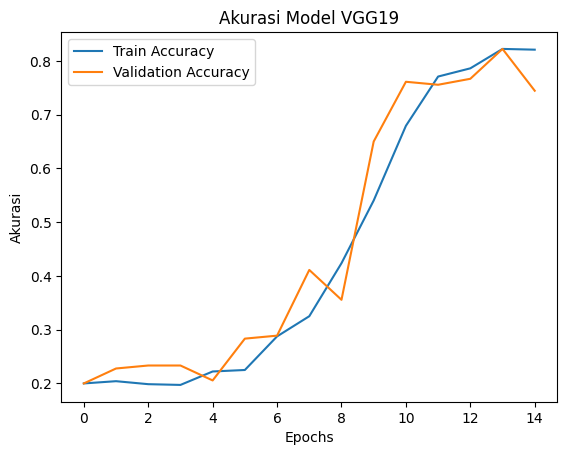

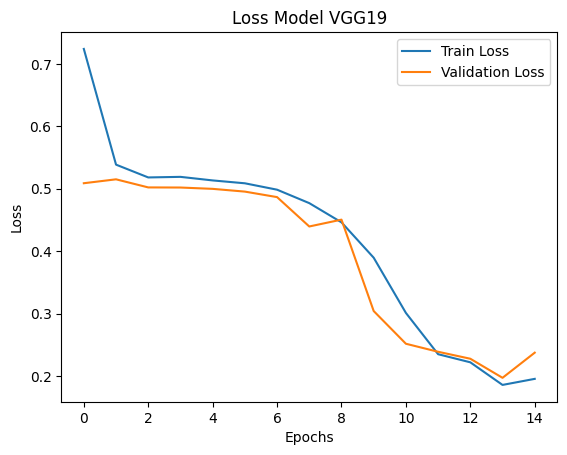

Found 180 images belonging to 5 classes.
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 352ms/step


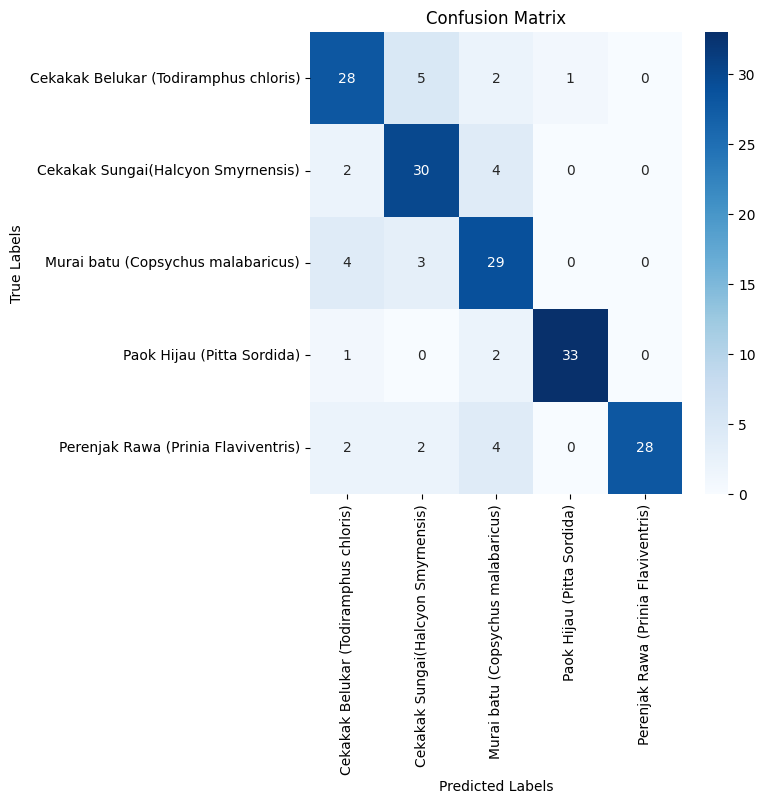

Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.78      0.77        36
           1       0.75      0.83      0.79        36
           2       0.71      0.81      0.75        36
           3       0.97      0.92      0.94        36
           4       1.00      0.78      0.88        36

    accuracy                           0.82       180
   macro avg       0.84      0.82      0.83       180
weighted avg       0.84      0.82      0.83       180

Accuracy per Class:
Cekakak Belukar (Todiramphus chloris): 77.78%
Cekakak Sungai(Halcyon Smyrnensis): 83.33%
Murai batu (Copsychus malabaricus): 80.56%
Paok Hijau (Pitta Sordida): 91.67%
Perenjak Rawa (Prinia Flaviventris): 77.78%


In [ ]:
#Plot Training
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Akurasi Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Akurasi')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


test_dir = test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'
test_datagen = ImageDataGenerator(rescale=1./255)

#Load data test
test_data = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    color_mode='rgb',
    class_mode='binary',
    shuffle=False
)

#Prediksi model pada data test
predictions = model.predict(test_data, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_data.classes


#Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)

#Visualisasi Confusion Matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_data.class_indices.keys(),
            yticklabels=test_data.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan laporan klasifikasi
print("Classification Report:\n", classification_report(true_labels, predicted_labels))

# Menghitung akurasi per kelas
accuracyclass = cm.diagonal() / cm.sum(axis=1)

# Menampilkan akurasi per kelas
print("Accuracy per Class:")
for class_name, accuracy in zip(test_data.class_indices.keys(), accuracyclass):
    print(f"{class_name}: {accuracy * 100:.2f}%")


### Testing

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


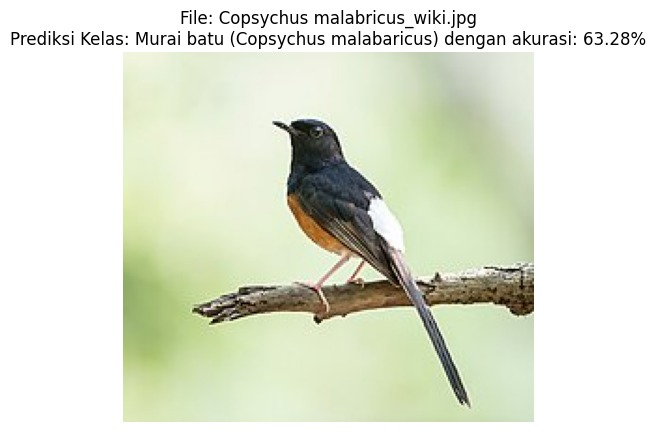

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


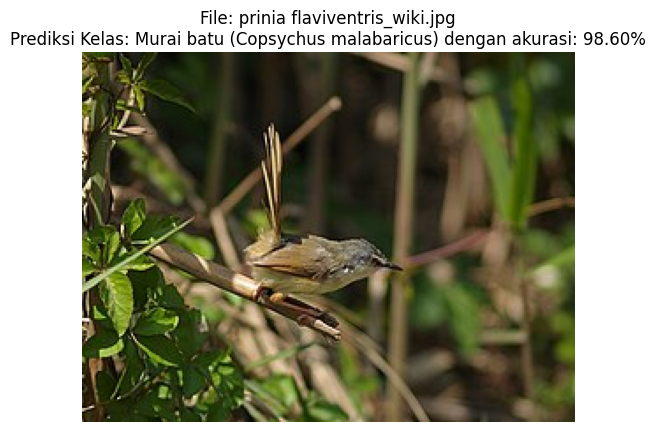

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


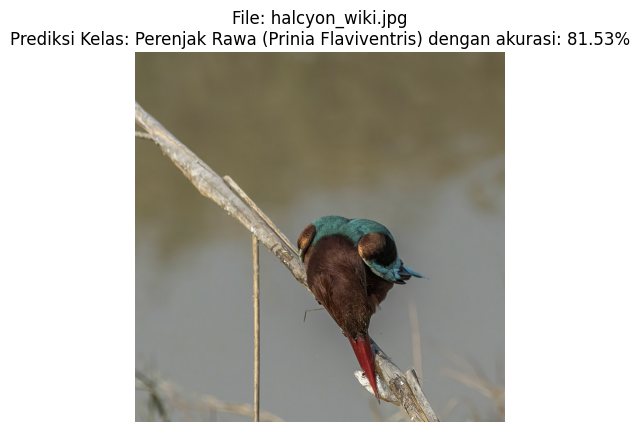

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


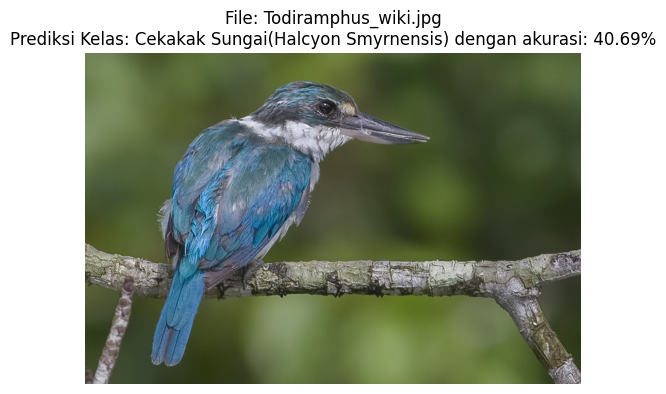

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


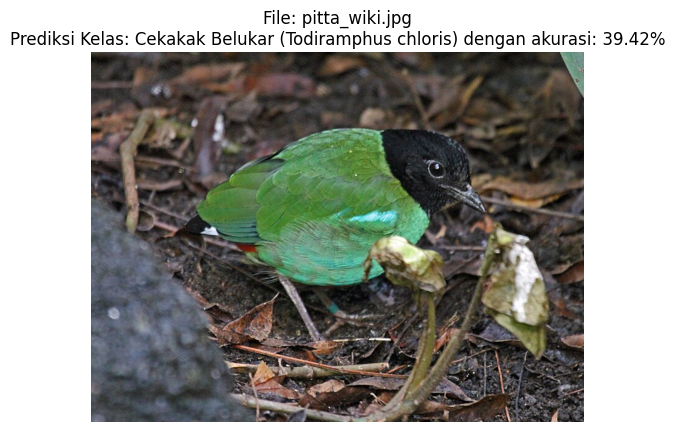

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Fungsi untuk memuat dan memproses gambar
def load_img(imge, target_size=(224, 224)):
    img = image.load_img(imge, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img_array

# Path direktori gambar
image_dir = '/content/drive/MyDrive/Image Processing/Gambar diluar split'

# Dapatkan semua file gambar dalam folder
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]

# Iterasi untuk setiap gambar
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)

    # Memuat dan memproses gambar
    img = load_img(image_path)

    # Prediksi dari model
    predictions = model.predict(img)
    predicted_label = np.argmax(predictions, axis=1)
    predicted_class = list(test_data.class_indices.keys())[predicted_label[0]]

    # Menampilkan gambar, prediksi dan nama file
    plt.imshow(image.load_img(image_path))
    plt.axis('off')
    plt.title(f'File: {image_file}\nPrediksi Kelas: {predicted_class} dengan akurasi: {predictions[0][predicted_label[0]]*100:.2f}%')
    plt.show()


# Model Learning Rate 1e-4

## Epoch 5

### Model

In [ ]:
# Library
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import numpy as np

#Data
train_dir  = '/content/drive/MyDrive/Image Processing/Image Processing/data split/train'
test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'

#Parameter
batch_size = 32
lr=1e-4
epochs=5

#ImageDataGenerator & Augmentasi Data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True)
valid_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    directory=train_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

test_data = valid_datagen.flow_from_directory(
    directory=test_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

#MODEL VGG19
#VGG16 sebagai base model
base_model = tf.keras.applications.VGG19(
    weights='imagenet',  #Pre-trained weights ImageNet
    include_top=False,
    input_shape=(224,224, 3)
)

#freeze layer terakhir dari base model untuk fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-5]:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(5, activation='sigmoid')
])

#Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

#Callback EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

#Training model
history = model.fit(
    train_data,
    validation_data=test_data,
    epochs=epochs,
    callbacks=[early_stopping])


Found 720 images belonging to 5 classes.
Found 180 images belonging to 5 classes.


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 7, 7, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,236,421 (88.64 MB)

 Trainable params: 12,651,269 (48.26 MB)

 Non-trainable params: 10,585,152 (40.38 MB)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 23s 618ms/step - accuracy: 0.3656 - loss: 0.5201 - val_accuracy: 0.8389 - val_loss: 0.2185
Epoch 2/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 473ms/step - accuracy: 0.8272 - loss: 0.2169 - val_accuracy: 0.9444 - val_loss: 0.1038
Epoch 3/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 536ms/step - accuracy: 0.9261 - loss: 0.1111 - val_accuracy: 0.9167 - val_loss: 0.1233
Epoch 4/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 529ms/step - accuracy: 0.9353 - loss: 0.0981 - val_accuracy: 0.9667 - val_loss: 0.0470
Epoch 5/5
23/23 ━━━━━━━━━━━━━━━━━━━━ 20s 458ms/step - accuracy: 0.9629 - loss: 0.0531 - val_accuracy: 0.9389 - val_loss: 0.0573


 ### Akurasi dan Evaluasi Model dengan Data Test

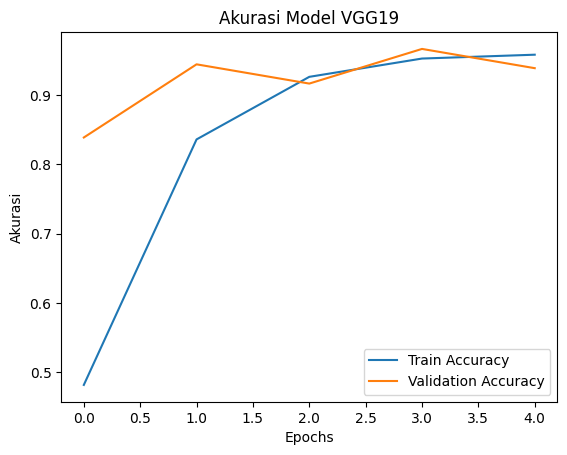

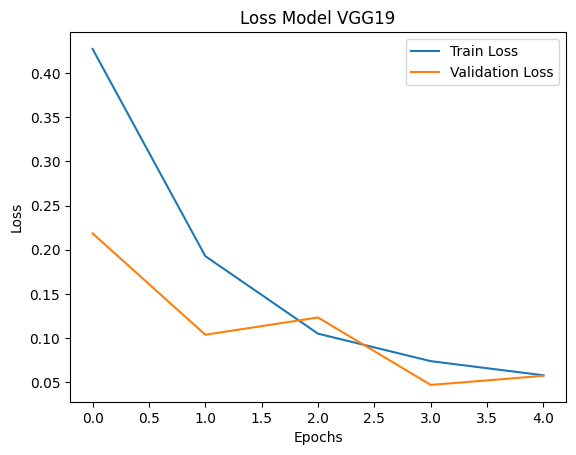

Found 180 images belonging to 5 classes.
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 214ms/step


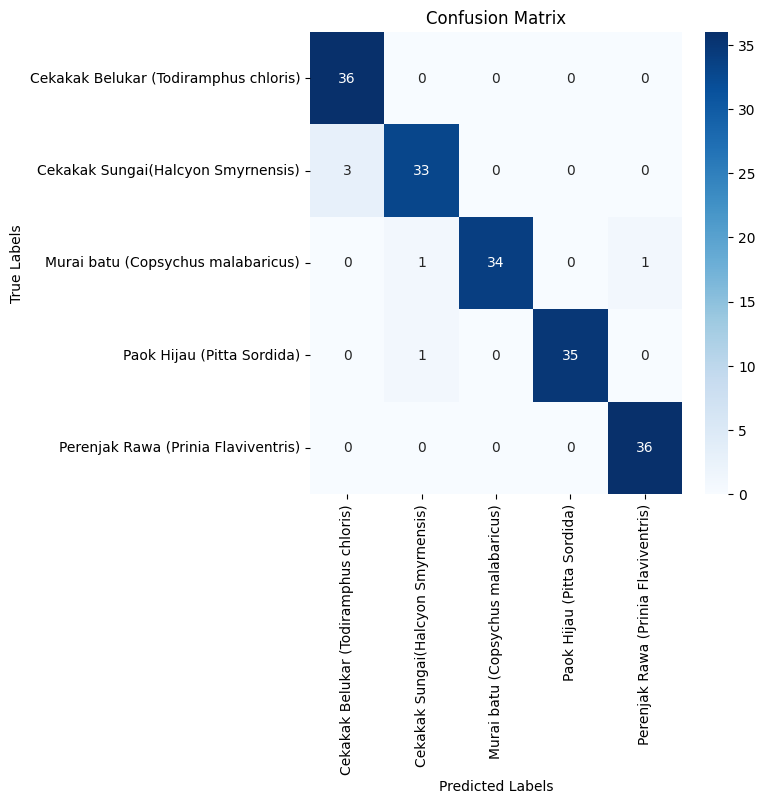

Classification Report:
               precision    recall  f1-score   support

           0       0.92      1.00      0.96        36
           1       0.94      0.92      0.93        36
           2       1.00      0.94      0.97        36
           3       1.00      0.97      0.99        36
           4       0.97      1.00      0.99        36

    accuracy                           0.97       180
   macro avg       0.97      0.97      0.97       180
weighted avg       0.97      0.97      0.97       180

Accuracy per Class:
Cekakak Belukar (Todiramphus chloris): 100.00%
Cekakak Sungai(Halcyon Smyrnensis): 91.67%
Murai batu (Copsychus malabaricus): 94.44%
Paok Hijau (Pitta Sordida): 97.22%
Perenjak Rawa (Prinia Flaviventris): 100.00%


In [ ]:
#Plot Training
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Akurasi Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Akurasi')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


test_dir = test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'
test_datagen = ImageDataGenerator(rescale=1./255)

#Load data test
test_data = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    color_mode='rgb',
    class_mode='binary',
    shuffle=False
)

#Prediksi model pada data test
predictions = model.predict(test_data, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_data.classes


#Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)

#Visualisasi Confusion Matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_data.class_indices.keys(),
            yticklabels=test_data.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan laporan klasifikasi
print("Classification Report:\n", classification_report(true_labels, predicted_labels))

# Menghitung akurasi per kelas
accuracyclass = cm.diagonal() / cm.sum(axis=1)

# Menampilkan akurasi per kelas
print("Accuracy per Class:")
for class_name, accuracy in zip(test_data.class_indices.keys(), accuracyclass):
    print(f"{class_name}: {accuracy * 100:.2f}%")


### Testing

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step


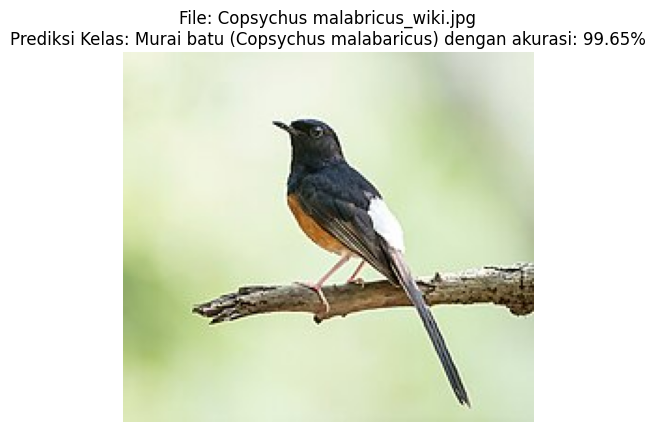

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


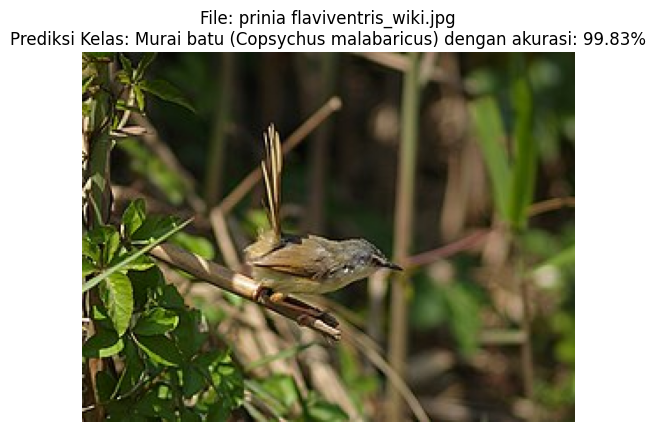

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


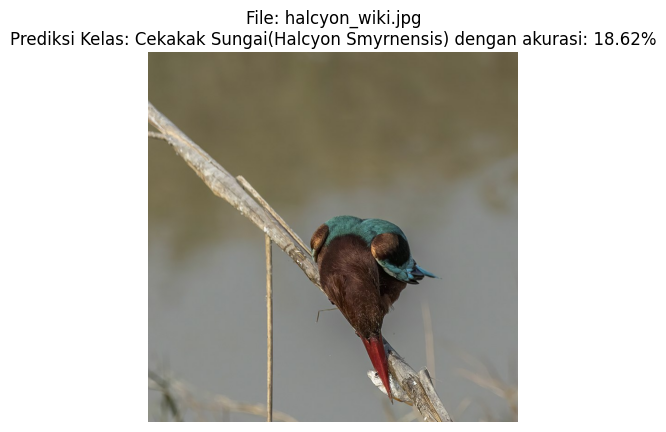

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


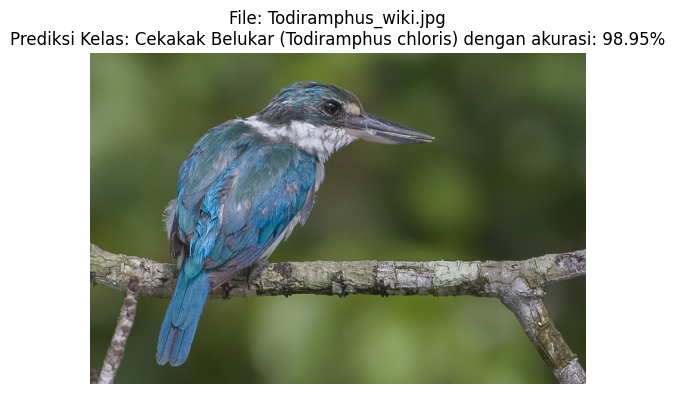

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


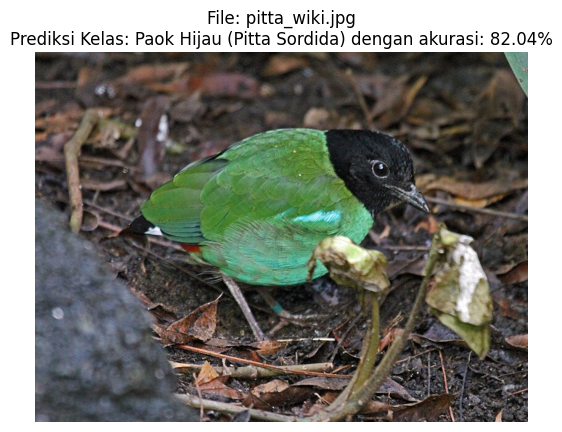

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Fungsi untuk memuat dan memproses gambar
def load_img(imge, target_size=(224, 224)):
    img = image.load_img(imge, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img_array

# Path direktori gambar
image_dir = '/content/drive/MyDrive/Image Processing/Gambar diluar split'

# Dapatkan semua file gambar dalam folder
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]

# Iterasi untuk setiap gambar
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)

    # Memuat dan memproses gambar
    img = load_img(image_path)

    # Prediksi dari model
    predictions = model.predict(img)
    predicted_label = np.argmax(predictions, axis=1)
    predicted_class = list(test_data.class_indices.keys())[predicted_label[0]]

    # Menampilkan gambar, prediksi dan nama file
    plt.imshow(image.load_img(image_path))
    plt.axis('off')
    plt.title(f'File: {image_file}\nPrediksi Kelas: {predicted_class} dengan akurasi: {predictions[0][predicted_label[0]]*100:.2f}%')
    plt.show()


## Epoch 10

### Model

In [ ]:
# Library
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import numpy as np

#Data
train_dir  = '/content/drive/MyDrive/Image Processing/Image Processing/data split/train'
test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'

#Parameter
batch_size = 32
lr=1e-4
epochs=10

#ImageDataGenerator & Augmentasi Data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True)
valid_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    directory=train_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

test_data = valid_datagen.flow_from_directory(
    directory=test_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

#MODEL VGG19
#VGG16 sebagai base model
base_model = tf.keras.applications.VGG19(
    weights='imagenet',  #Pre-trained weights ImageNet
    include_top=False,
    input_shape=(224,224, 3)
)

#freeze layer terakhir dari base model untuk fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-5]:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(5, activation='sigmoid')
])

#Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

#Callback EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

#Training model
history = model.fit(
    train_data,
    validation_data=test_data,
    epochs=epochs,
    callbacks=[early_stopping])


Found 720 images belonging to 5 classes.
Found 180 images belonging to 5 classes.


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 7, 7, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,236,421 (88.64 MB)

 Trainable params: 12,651,269 (48.26 MB)

 Non-trainable params: 10,585,152 (40.38 MB)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 23s 621ms/step - accuracy: 0.3684 - loss: 0.5176 - val_accuracy: 0.8111 - val_loss: 0.2153
Epoch 2/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 532ms/step - accuracy: 0.7819 - loss: 0.2314 - val_accuracy: 0.8889 - val_loss: 0.1250
Epoch 3/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 556ms/step - accuracy: 0.8898 - loss: 0.1305 - val_accuracy: 0.9389 - val_loss: 0.0785
Epoch 4/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 15s 518ms/step - accuracy: 0.9675 - loss: 0.0584 - val_accuracy: 0.9333 - val_loss: 0.0874
Epoch 5/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 449ms/step - accuracy: 0.9806 - loss: 0.0334 - val_accuracy: 0.9278 - val_loss: 0.0921
Epoch 6/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 529ms/step - accuracy: 0.9530 - loss: 0.0649 - val_accuracy: 0.9556 - val_loss: 0.0475
Epoch 7/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 499ms/step - accuracy: 0.9903 - loss: 0.0249 - val_accuracy: 0.9500 - val_loss: 0.0712
Epoch 8/10
23/23 ━━━━━━━━━━━━━━━━━━━━ 19s 483ms/step - accuracy: 0.9955 - loss: 0.0111 - val_accuracy: 0.944

### Akurasi dan Evaluasi Model dengan Data Test

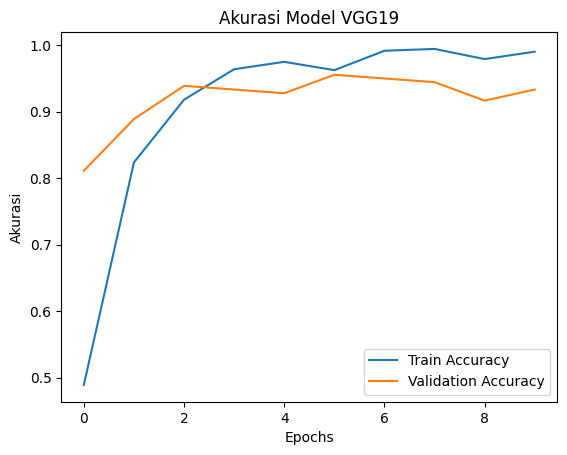

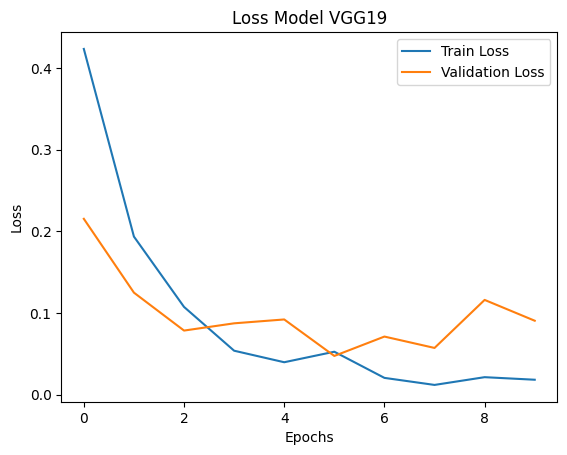

Found 180 images belonging to 5 classes.
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step


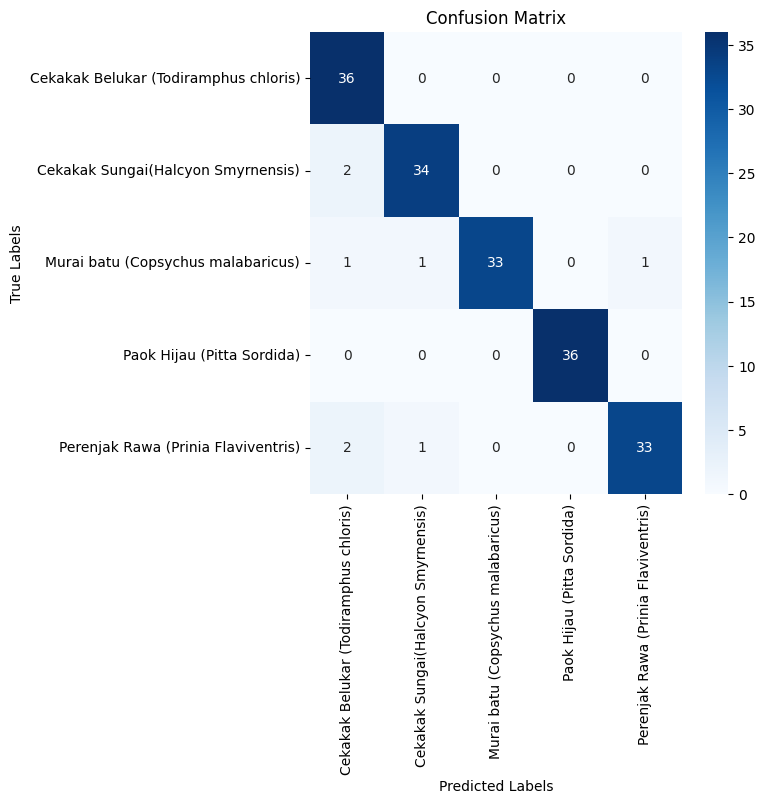

Classification Report:
               precision    recall  f1-score   support

           0       0.88      1.00      0.94        36
           1       0.94      0.94      0.94        36
           2       1.00      0.92      0.96        36
           3       1.00      1.00      1.00        36
           4       0.97      0.92      0.94        36

    accuracy                           0.96       180
   macro avg       0.96      0.96      0.96       180
weighted avg       0.96      0.96      0.96       180

Accuracy per Class:
Cekakak Belukar (Todiramphus chloris): 100.00%
Cekakak Sungai(Halcyon Smyrnensis): 94.44%
Murai batu (Copsychus malabaricus): 91.67%
Paok Hijau (Pitta Sordida): 100.00%
Perenjak Rawa (Prinia Flaviventris): 91.67%


In [ ]:
#Plot Training
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Akurasi Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Akurasi')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


test_dir = test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'
test_datagen = ImageDataGenerator(rescale=1./255)

#Load data test
test_data = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    color_mode='rgb',
    class_mode='binary',
    shuffle=False
)

#Prediksi model pada data test
predictions = model.predict(test_data, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_data.classes


#Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)

#Visualisasi Confusion Matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_data.class_indices.keys(),
            yticklabels=test_data.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan laporan klasifikasi
print("Classification Report:\n", classification_report(true_labels, predicted_labels))

# Menghitung akurasi per kelas
accuracyclass = cm.diagonal() / cm.sum(axis=1)

# Menampilkan akurasi per kelas
print("Accuracy per Class:")
for class_name, accuracy in zip(test_data.class_indices.keys(), accuracyclass):
    print(f"{class_name}: {accuracy * 100:.2f}%")


### Testing

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step


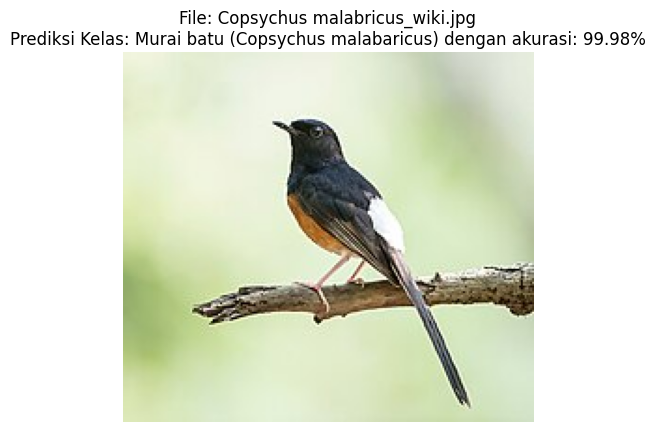

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


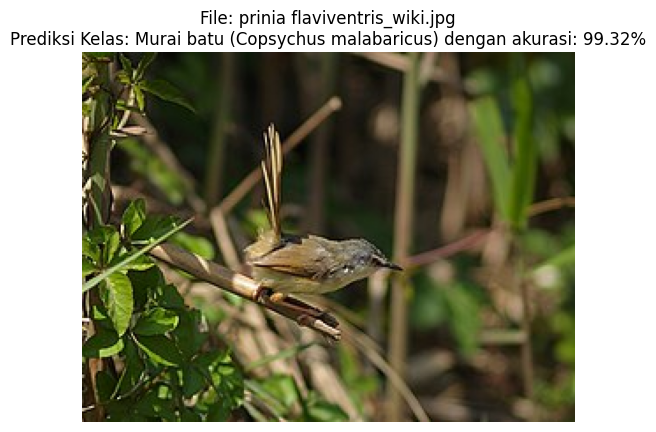

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


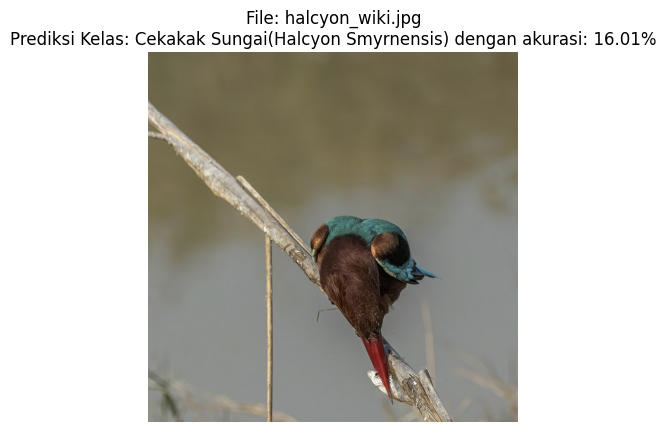

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


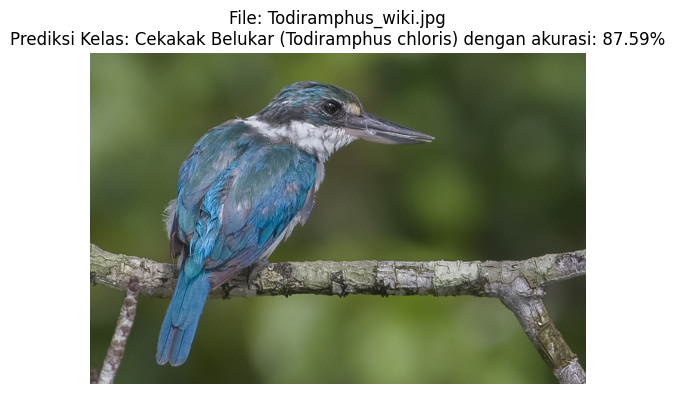

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


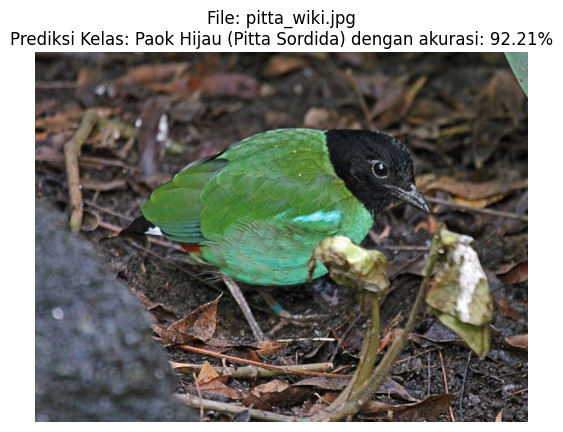

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Fungsi untuk memuat dan memproses gambar
def load_img(imge, target_size=(224, 224)):
    img = image.load_img(imge, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img_array

# Path direktori gambar
image_dir = '/content/drive/MyDrive/Image Processing/Gambar diluar split'

# Dapatkan semua file gambar dalam folder
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]

# Iterasi untuk setiap gambar
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)

    # Memuat dan memproses gambar
    img = load_img(image_path)

    # Prediksi dari model
    predictions = model.predict(img)
    predicted_label = np.argmax(predictions, axis=1)
    predicted_class = list(test_data.class_indices.keys())[predicted_label[0]]

    # Menampilkan gambar, prediksi dan nama file
    plt.imshow(image.load_img(image_path))
    plt.axis('off')
    plt.title(f'File: {image_file}\nPrediksi Kelas: {predicted_class} dengan akurasi: {predictions[0][predicted_label[0]]*100:.2f}%')
    plt.show()


## Epoch 15

### Model

In [ ]:
# Library
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import numpy as np

#Data
train_dir  = '/content/drive/MyDrive/Image Processing/Image Processing/data split/train'
test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'

#Parameter
batch_size = 32
lr=1e-4
epochs=15

#ImageDataGenerator & Augmentasi Data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True)
valid_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    directory=train_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

test_data = valid_datagen.flow_from_directory(
    directory=test_dir,target_size=(224, 224),batch_size=batch_size,color_mode='rgb')

#MODEL VGG19
#VGG16 sebagai base model
base_model = tf.keras.applications.VGG19(
    weights='imagenet',  #Pre-trained weights ImageNet
    include_top=False,
    input_shape=(224,224, 3)
)

#freeze layer terakhir dari base model untuk fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-5]:
    layer.trainable = False

model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(5, activation='sigmoid')
])

#Compile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

#Callback EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

#Training model
history = model.fit(
    train_data,
    validation_data=test_data,
    epochs=epochs,
    callbacks=[early_stopping])


Found 720 images belonging to 5 classes.
Found 180 images belonging to 5 classes.


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 7, 7, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,236,421 (88.64 MB)

 Trainable params: 12,651,269 (48.26 MB)

 Non-trainable params: 10,585,152 (40.38 MB)

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


23/23 ━━━━━━━━━━━━━━━━━━━━ 23s 646ms/step - accuracy: 0.2774 - loss: 0.5273 - val_accuracy: 0.7944 - val_loss: 0.2489
Epoch 2/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 527ms/step - accuracy: 0.7578 - loss: 0.2422 - val_accuracy: 0.8944 - val_loss: 0.1159
Epoch 3/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 522ms/step - accuracy: 0.8901 - loss: 0.1296 - val_accuracy: 0.9389 - val_loss: 0.0778
Epoch 4/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 531ms/step - accuracy: 0.9372 - loss: 0.0836 - val_accuracy: 0.9722 - val_loss: 0.0488
Epoch 5/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 549ms/step - accuracy: 0.9732 - loss: 0.0413 - val_accuracy: 0.9667 - val_loss: 0.0442
Epoch 6/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 20s 467ms/step - accuracy: 0.9814 - loss: 0.0308 - val_accuracy: 0.9444 - val_loss: 0.0612
Epoch 7/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 17s 536ms/step - accuracy: 0.9832 - loss: 0.0266 - val_accuracy: 0.9389 - val_loss: 0.0778
Epoch 8/15
23/23 ━━━━━━━━━━━━━━━━━━━━ 16s 545ms/step - accuracy: 0.9806 - loss: 0.0331 - val_accuracy: 0.955

### Akurasi dan Evaluasi Model dengan Data Test

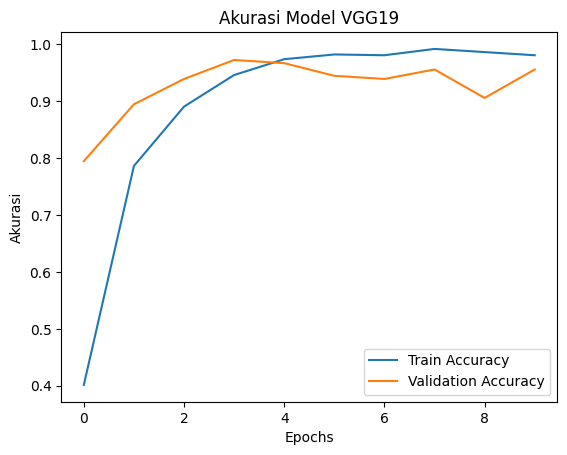

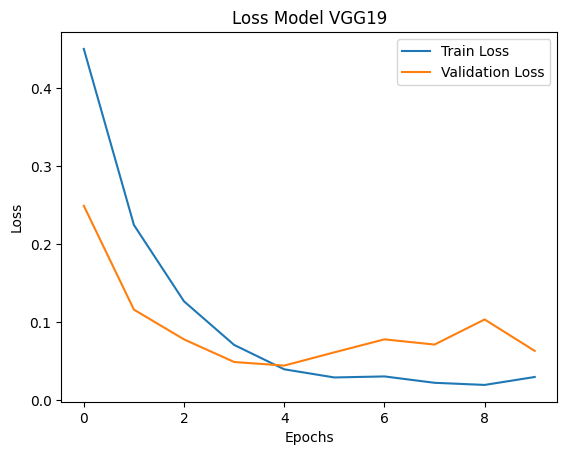

Found 180 images belonging to 5 classes.
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 198ms/step


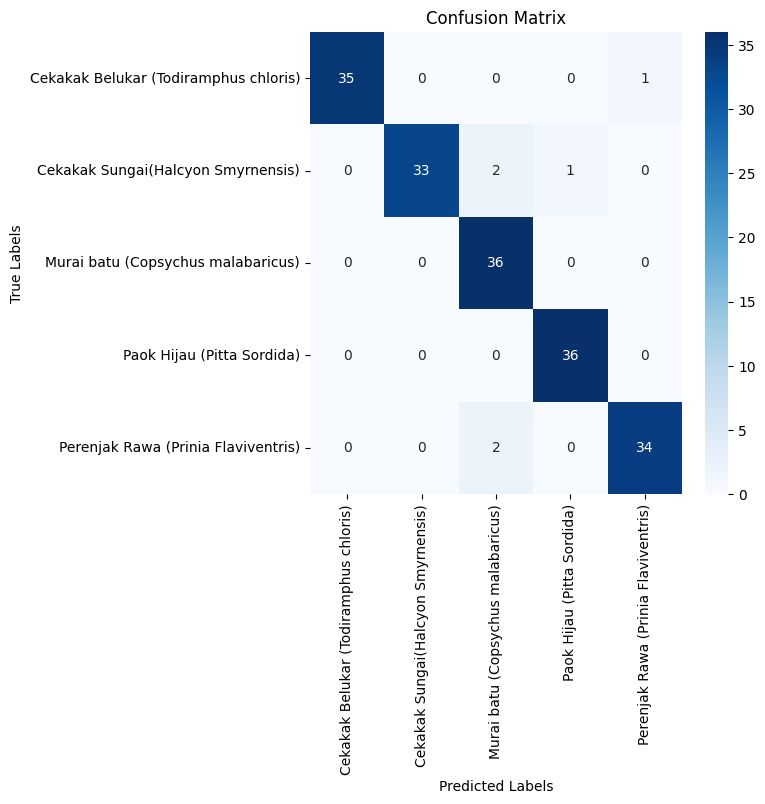

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.99        36
           1       1.00      0.92      0.96        36
           2       0.90      1.00      0.95        36
           3       0.97      1.00      0.99        36
           4       0.97      0.94      0.96        36

    accuracy                           0.97       180
   macro avg       0.97      0.97      0.97       180
weighted avg       0.97      0.97      0.97       180

Accuracy per Class:
Cekakak Belukar (Todiramphus chloris): 97.22%
Cekakak Sungai(Halcyon Smyrnensis): 91.67%
Murai batu (Copsychus malabaricus): 100.00%
Paok Hijau (Pitta Sordida): 100.00%
Perenjak Rawa (Prinia Flaviventris): 94.44%


In [ ]:
#Plot Training
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Akurasi Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Akurasi')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Model VGG19')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


test_dir = test_dir = '/content/drive/MyDrive/Image Processing/Image Processing/data split/test'
test_datagen = ImageDataGenerator(rescale=1./255)

#Load data test
test_data = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=(224,224),
    batch_size=batch_size,
    color_mode='rgb',
    class_mode='binary',
    shuffle=False
)

#Prediksi model pada data test
predictions = model.predict(test_data, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = test_data.classes


#Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)

#Visualisasi Confusion Matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_data.class_indices.keys(),
            yticklabels=test_data.class_indices.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Menampilkan laporan klasifikasi
print("Classification Report:\n", classification_report(true_labels, predicted_labels))

# Menghitung akurasi per kelas
accuracyclass = cm.diagonal() / cm.sum(axis=1)

# Menampilkan akurasi per kelas
print("Accuracy per Class:")
for class_name, accuracy in zip(test_data.class_indices.keys(), accuracyclass):
    print(f"{class_name}: {accuracy * 100:.2f}%")


### Testing

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


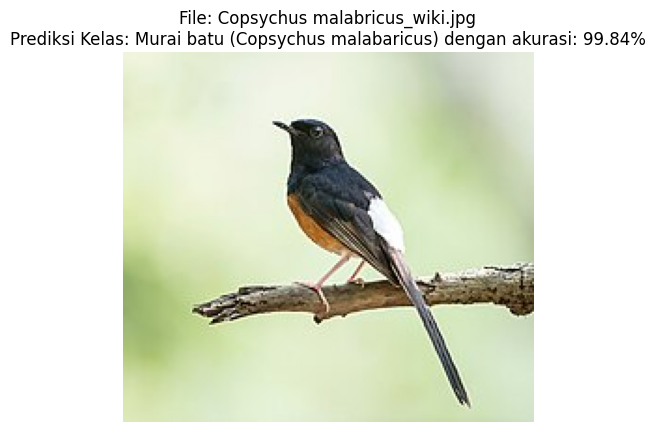

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


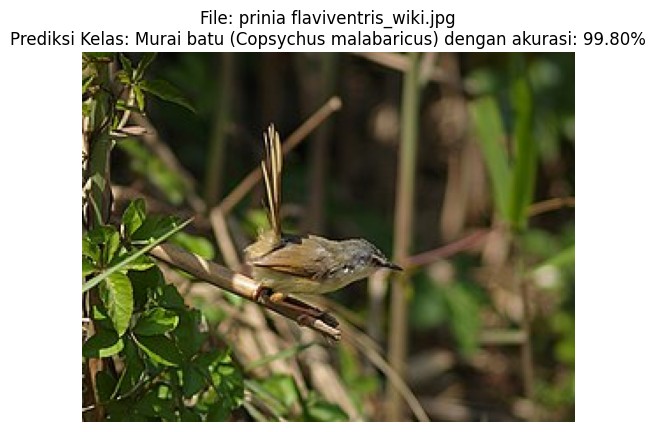

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


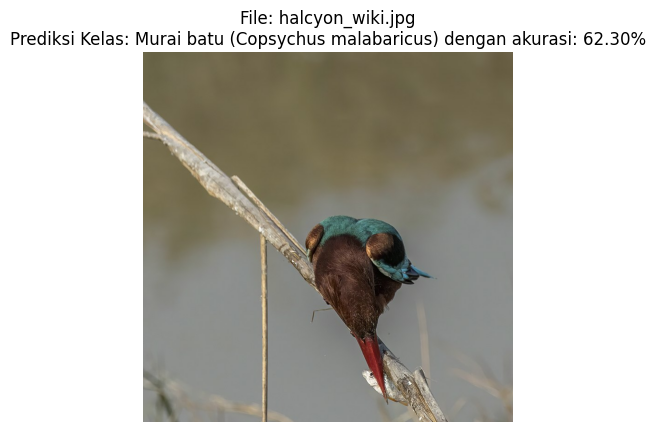

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


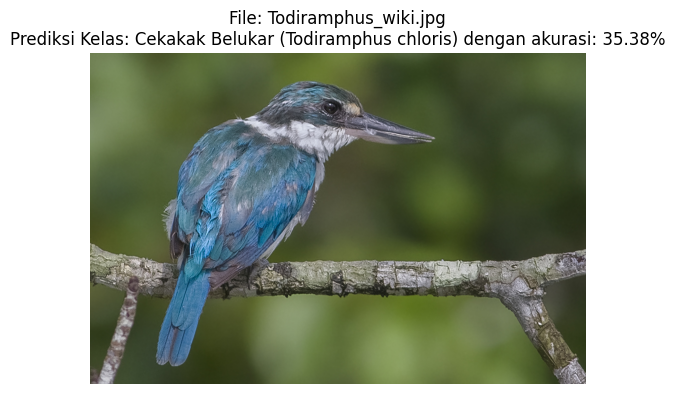

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


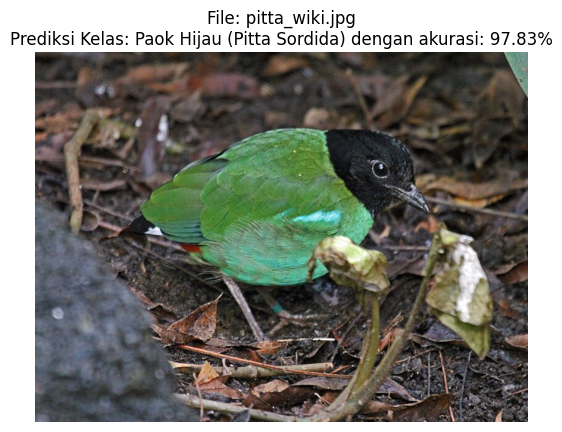

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Fungsi untuk memuat dan memproses gambar
def load_img(imge, target_size=(224, 224)):
    img = image.load_img(imge, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0
    return img_array

# Path direktori gambar
image_dir = '/content/drive/MyDrive/Image Processing/Gambar diluar split'

# Dapatkan semua file gambar dalam folder
image_files = [f for f in os.listdir(image_dir) if f.endswith(('jpg', 'jpeg', 'png'))]

# Iterasi untuk setiap gambar
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)

    # Memuat dan memproses gambar
    img = load_img(image_path)

    # Prediksi dari model
    predictions = model.predict(img)
    predicted_label = np.argmax(predictions, axis=1)
    predicted_class = list(test_data.class_indices.keys())[predicted_label[0]]

    # Menampilkan gambar, prediksi dan nama file
    plt.imshow(image.load_img(image_path))
    plt.axis('off')
    plt.title(f'File: {image_file}\nPrediksi Kelas: {predicted_class} dengan akurasi: {predictions[0][predicted_label[0]]*100:.2f}%')
    plt.show()
